# Student ID: 2202398

**Code References**  
The model training, validation and prediction codes used in this assignment are adapted from the following websites:
* https://scikit-learn.org/stable/user_guide.html
* https://plotly.com/python/
* https://stackoverflow.com

Let's install all required libraries.

In [1]:
!pip install pandas
!pip install seaborn
!pip install missingno
!pip install plotly
!pip install xgboost
!pip install catboost

/Users/adekunbi/.zshenv:export:1: not valid in this context: Plug-Ins/JavaAppletPlugin.plugin/Contents/Home
/Users/adekunbi/.zshenv:export:1: not valid in this context: Plug-Ins/JavaAppletPlugin.plugin/Contents/Home
/Users/adekunbi/.zshenv:export:1: not valid in this context: Plug-Ins/JavaAppletPlugin.plugin/Contents/Home
/Users/adekunbi/.zshenv:export:1: not valid in this context: Plug-Ins/JavaAppletPlugin.plugin/Contents/Home
/Users/adekunbi/.zshenv:export:1: not valid in this context: Plug-Ins/JavaAppletPlugin.plugin/Contents/Home
/Users/adekunbi/.zshenv:export:1: not valid in this context: Plug-Ins/JavaAppletPlugin.plugin/Contents/Home


Let's import all required packages.

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.subplots as sp
import plotly.graph_objects as go
import missingno as msno

from sklearn.linear_model import LinearRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
from sklearn.metrics import mean_squared_error, mean_absolute_error, median_absolute_error, r2_score

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier
from catboost import CatBoostClassifier
from xgboost import XGBClassifier


Let's set `seed` for all libraries as student id

In [3]:
#numpy seed
seed_value = 2202398 # My student ID
np.random.seed(seed_value)

## Data Preprocessing

Let's load the train data file and describe the columns

In [4]:

train_df = pd.read_csv('train.csv')

# Extract column names and types into reusable variables
column_names = train_df.columns.tolist()
column_types = [train_df[col].dtype for col in column_names]

# Add descriptions for extracted columns
column_descriptions = ['serial number','Customer id', 'Male/Female', 'Loyal/Disloyal', 'Age in years','Business/Personal', 
                       'Eco/Eco Plus/Business', 'Distance in KM','Level from 0 to 5','Level from 0 to 5','Level from 0 to 5',
                      'Level from 0 to 5','Level from 0 to 5','Level from 0 to 5','Level from 0 to 5','Level from 0 to 5',
                      'Level from 0 to 5','Level from 0 to 5','Level from 0 to 5','Level from 0 to 5','Level from 0 to 5',
                      'Level from 0 to 5','Departure Delay in minutes','Arrival Delay in minutes','Class column']

# Create a DataFrame using the prepared column information
column_info_df = pd.DataFrame({
    'Column Name': column_names,
    'Type': column_types,
    'Description': column_descriptions
})

# Style the dataframe for better presentation
column_info_df = column_info_df.style.set_table_styles([
    {'selector': 'th', 'props': [('border', '1px solid black'),('text-align', 'left')]},
    {'selector': 'td', 'props': [('border', '1px solid black'),('text-align', 'left')]}
])

# Let's see the column information
column_info_df


,Column Name,Type,Description
0,Unnamed: 0,int64,serial number
1,id,int64,Customer id
2,Gender,object,Male/Female
3,Customer Type,object,Loyal/Disloyal
4,Age,int64,Age in years
5,Type of Travel,object,Business/Personal
6,Class,object,Eco/Eco Plus/Business
7,Flight Distance,int64,Distance in KM
8,Inflight wifi service,int64,Level from 0 to 5
9,Departure/Arrival time convenient,int64,Level from 0 to 5


Let's see the number of rows and columns in our dataset

In [5]:
print(f'Number of rows: {train_df.shape[0]}')
print(f'Number of columns: {train_df.shape[1]}')

Number of rows: 103904
Number of columns: 25


Let's see the first few rows of the train data

In [6]:
train_df.head()

,Unnamed: 0,id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,...,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
0,0,70172,Male,Loyal Customer,13,Personal Travel,Eco Plus,460,3,4,...,5,4,3,4,4,5,5,25,18.0,neutral or dissatisfied
1,1,5047,Male,disloyal Customer,25,Business travel,Business,235,3,2,...,1,1,5,3,1,4,1,1,6.0,neutral or dissatisfied
2,2,110028,Female,Loyal Customer,26,Business travel,Business,1142,2,2,...,5,4,3,4,4,4,5,0,0.0,satisfied
3,3,24026,Female,Loyal Customer,25,Business travel,Business,562,2,5,...,2,2,5,3,1,4,2,11,9.0,neutral or dissatisfied
4,4,119299,Male,Loyal Customer,61,Business travel,Business,214,3,3,...,3,3,4,4,3,3,3,0,0.0,satisfied


Let's identify and display missing values from dataset

In [7]:
missing_values_count = train_df.isnull().sum()
missing_values_count


Unnamed: 0                             0
id                                     0
Gender                                 0
Customer Type                          0
Age                                    0
Type of Travel                         0
Class                                  0
Flight Distance                        0
Inflight wifi service                  0
Departure/Arrival time convenient      0
Ease of Online booking                 0
Gate location                          0
Food and drink                         0
Online boarding                        0
Seat comfort                           0
Inflight entertainment                 0
On-board service                       0
Leg room service                       0
Baggage handling                       0
Checkin service                        0
Inflight service                       0
Cleanliness                            0
Departure Delay in Minutes             0
Arrival Delay in Minutes             310
satisfaction    

Let's display a bar chart for our missing values data

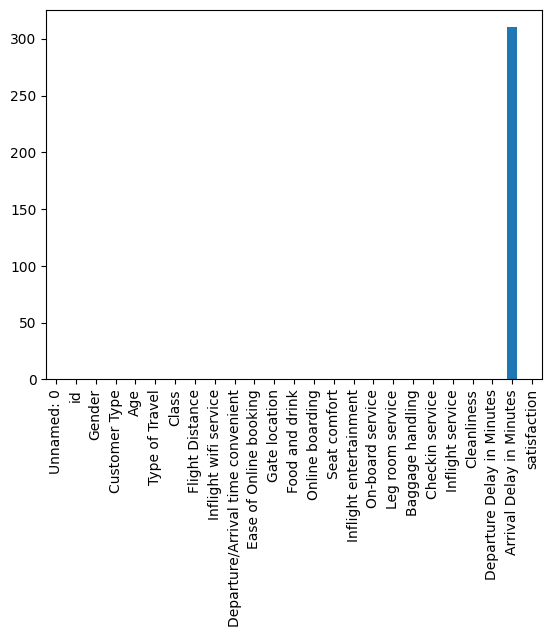

In [8]:
missing_values_count.plot(kind='bar')
plt.show()


Let's display a correlation matrix between the variables in the dataset

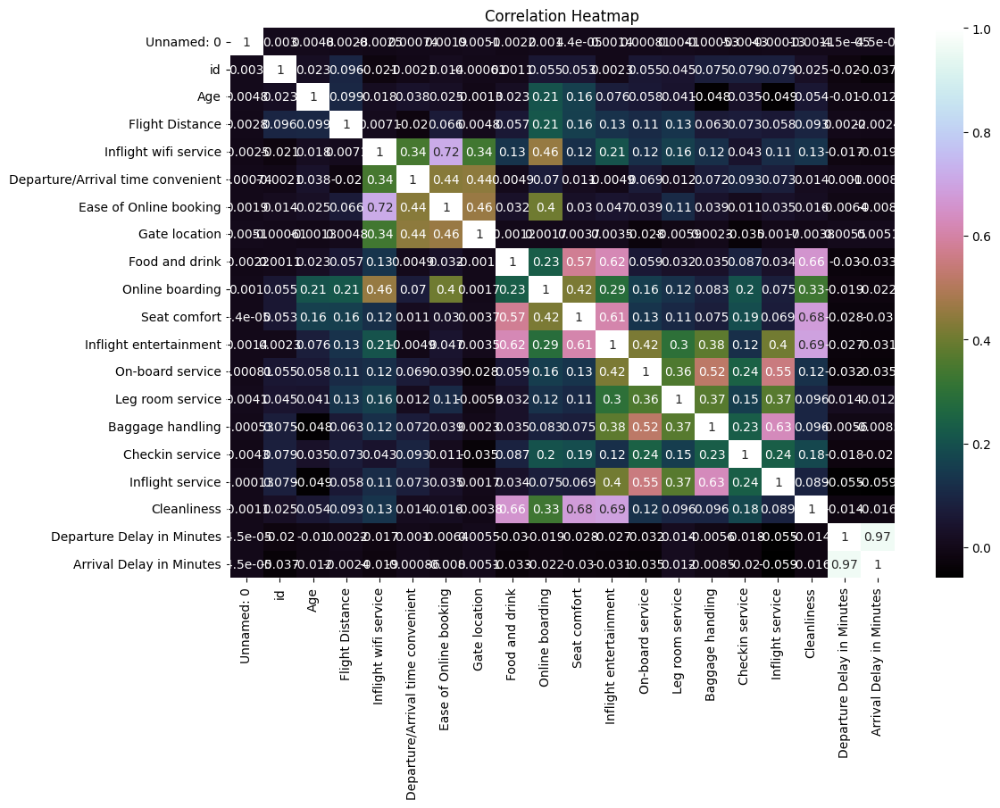

In [9]:
# Select numeric columns from the DataFrame
numeric_columns = train_df.select_dtypes(include=["int64", "float64"])

correlation_matrix = numeric_columns.corr()

# Create the heatmap using seaborn library
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap="cubehelix")
plt.title("Correlation Heatmap")

# Display the correlation matrix
plt.show()

Let's use Linear Regression model to predict the missing Arrival delay in minutes based on the Departure delay in minutes values present in the dataset

In [10]:
# Create a subset of the applicable columns
train_subset = train_df[['Arrival Delay in Minutes', 'Departure Delay in Minutes']]

# Separate the predictors from the target
X_train = train_subset[train_subset['Arrival Delay in Minutes'].notnull()]['Departure Delay in Minutes']
y_train = train_subset[train_subset['Arrival Delay in Minutes'].notnull()]['Arrival Delay in Minutes']

lr_model = LinearRegression()
lr_model.fit(X_train.values.reshape(-1, 1), y_train)

# Generate predictions on the training data
y_train_pred = lr_model.predict(X_train.values.reshape(-1, 1))

# Predict the missing values in the train dataset
X_test_train = train_subset[train_subset['Arrival Delay in Minutes'].isnull()]['Departure Delay in Minutes']
y_train_pred = lr_model.predict(X_test_train.values.reshape(-1, 1))

# Use the predicted values to fill in the missing ones in the original dataset
train_df.loc[train_subset['Arrival Delay in Minutes'].isnull(), 'Arrival Delay in Minutes'] = y_train_pred

# Calculate the number of missing 'Arrival Delay in Minutes' before and after prediction
missing_before_prediction_train = train_subset['Arrival Delay in Minutes'].isnull().sum()
missing_after_prediction_train = train_df['Arrival Delay in Minutes'].isnull().sum()

# Display statistics about the data set, and its state before and after the predicted values were added
num_predicted_rows_train = missing_before_prediction_train - missing_after_prediction_train
print("Number of predicted rows in the train data:", num_predicted_rows_train)

num_known_rows_train = train_df.shape[0] - num_predicted_rows_train
print("Number of other rows (already known) in the train data:", num_known_rows_train)
print ("\n")

# Let's evaluate the model's performance
y_train_pred_full = lr_model.predict(X_train.values.reshape(-1, 1))
mse_train = mean_squared_error(y_train, y_train_pred_full)
rmse_train = np.sqrt(mse_train)
mae_train = mean_absolute_error(y_train, y_train_pred_full)
me_train = median_absolute_error(y_train, y_train_pred_full)
r2_train = r2_score(y_train, y_train_pred_full)

# Calculate adjusted R-squared for train dataset
n_train = len(y_train)
p_train = 1
r2_adj_train = 1 - ((1 - r2_train) * (n_train - 1) / (n_train - p_train - 1))

# Display the evaluation metrics
print("Train Set - Mean Squared Error (MSE):", mse_train)
print("Train Set - Coefficient of Determination (R^2):", r2_train)
print("Train Set - Root Mean Squared Error (RMSE):", rmse_train)
print("Train Set - Mean Absolute Error (MAE):", mae_train)
print("Train Set - Median Absolute Error (ME):", me_train)
print("Train Set - Coefficient of Determination (R^2): Adjusted", r2_adj_train)


Number of predicted rows in the train data: 310
Number of other rows (already known) in the train data: 103594


Train Set - Mean Squared Error (MSE): 101.605316068993
Train Set - Coefficient of Determination (R^2): 0.9321533709209897
Train Set - Root Mean Squared Error (RMSE): 10.079946233437607
Train Set - Mean Absolute Error (MAE): 5.267777667323738
Train Set - Median Absolute Error (ME): 1.2775660497397396
Train Set - Coefficient of Determination (R^2): Adjusted 0.932152715980173


Let's use scatter plots to display the proportionality between the two variables

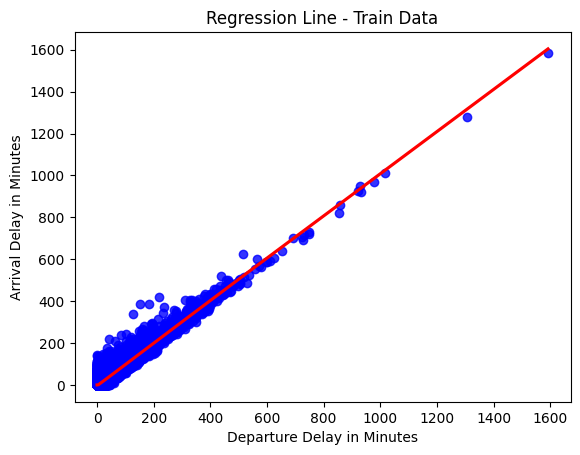

In [11]:
# Scatter plot with regression line before prediction 
sns.regplot(x=X_train, y=y_train, lowess=True, scatter_kws={'color': 'blue'}, line_kws={'color': 'red'})
plt.xlabel('Departure Delay in Minutes')
plt.ylabel('Arrival Delay in Minutes')
plt.title('Regression Line - Train Data')
plt.show()


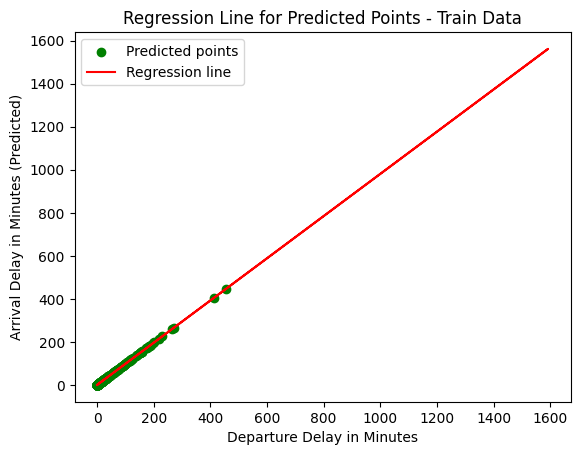

In [12]:
# Scatter plot with regression line for predicted points
plt.scatter(X_test_train, y_train_pred, color='green', label='Predicted points')
plt.plot(X_train, y_train_pred_full, color='red', label='Regression line')
plt.xlabel('Departure Delay in Minutes')
plt.ylabel('Arrival Delay in Minutes (Predicted)')
plt.title('Regression Line for Predicted Points - Train Data')
plt.legend()
plt.show()


Let's analyze the data and display services rated by gender

In [13]:
# The list of service columns to evaluate
service_cols = ['Cleanliness', 'Inflight service', 'Checkin service', 'Baggage handling',
                'Leg room service', 'On-board service', 'Inflight entertainment',
                'Seat comfort', 'Online boarding', 'Food and drink', 'Gate location',
                'Ease of Online booking', 'Departure/Arrival time convenient','Inflight wifi service']

# Determine the number of rows needed to accommodate all the service columns
num_rows = -(-len(service_cols) // 3)

# Create subplots, with num_rows rows and 3 columns
fig = sp.make_subplots(rows=num_rows, cols=3, subplot_titles=service_cols)

# Specify the color for each gender category
colors = {'Male': '#d8b365', 'Female': '#5ab4ac'}

# For each service column, calculate the gender counts and add a bar chart to the subplots
for i, service in enumerate(service_cols, 1):
    count_df = train_df.groupby(['Gender', service]).size().reset_index(name='Counts')
    total_counts = count_df.groupby(service)['Counts'].sum()
    ordered_levels = total_counts.sort_values().index
    count_df[service] = pd.Categorical(count_df[service], categories=ordered_levels, ordered=True)
    
    for gender in count_df['Gender'].unique():
        gender_data = count_df[count_df['Gender'] == gender]
        fig.add_trace(go.Bar(x=gender_data[service], y=gender_data['Counts'], name=gender, 
                             marker_color=colors[gender], showlegend=(i==1)),
                      row=(i-1)//3+1, col=(i-1)%3+1)

# Display the result
fig.update_layout(height=1500, width=1000, title_text="Gender Count by Service Type")
fig.show()


Let's analyze the data and display services based on satisfaction

In [14]:
# Create subplots, with num_rows rows and 3 columns
fig = sp.make_subplots(rows=num_rows, cols=3, subplot_titles=service_cols, vertical_spacing=0.1)

# Specify the color for each satisfaction category
colors = {'neutral or dissatisfied': '#fc8d59', 'satisfied': '#ffffbf'}

# For each service column, calculate the satisfaction counts and add a bar chart to the subplots
for i, service in enumerate(service_cols, 1):
    count_df = train_df.groupby(['satisfaction', service]).size().reset_index(name='Counts')
    total_counts = count_df.groupby(service)['Counts'].sum()
    ordered_levels = total_counts.sort_values().index
    count_df[service] = pd.Categorical(count_df[service], categories=ordered_levels, ordered=True)
    
    for satisfaction in count_df['satisfaction'].unique():
        satisfaction_data = count_df[count_df['satisfaction'] == satisfaction]
        fig.add_trace(go.Bar(x=satisfaction_data[service], y=satisfaction_data['Counts'], name=satisfaction,
                             marker_color=colors[satisfaction], showlegend=(i==1)),
                      row=(i-1)//3+1, col=(i-1)%3+1)


# Display the result
fig.update_layout(height=1000, width=1000, title_text="Satisfaction Count by Service Type")
fig.show()


Let's analyze the data and group customer types based on gender

In [15]:
grouped_df = train_df.groupby(['Customer Type', 'Gender']).size().reset_index(name='Counts')

# Lists of unique customer types and genders
customer_types = grouped_df['Customer Type'].unique()
genders = grouped_df['Gender'].unique()

# Specify the color for each gender category
colors = {'Male': '#1b9e77', 'Female': '#d95f02'}

# Create an empty figure
fig = go.Figure()

# For each gender, add a bar to the figure
for gender in genders:
    df = grouped_df[grouped_df['Gender'] == gender]
    fig.add_trace(go.Bar(x=df['Customer Type'], y=df['Counts'], name=gender, marker_color=colors[gender]))

# Update the layout of the figure
fig.update_layout(
    barmode='stack',  # Make the bars stacked
    title_text="Distribution of Gender by Customer Type",
    autosize=False, width=600, height=500, paper_bgcolor="white",
    legend_title_text='Gender',
    xaxis_title="Customer Type",
    yaxis_title="Counts")

# Display the result
fig.show()


Let's analyze the data and group travel types based on gender

In [16]:
grouped_df = train_df.groupby(['Type of Travel', 'Gender']).size().reset_index(name='Counts')

# Lists of unique travel types and genders
travel_types = grouped_df['Type of Travel'].unique()
genders = grouped_df['Gender'].unique()

# Specify the color for each gender category
colors = {'Male': '#1b9e77', 'Female': '#d95f02'}

# Create an empty figure
fig = go.Figure()

# For each gender, add a bar to the figure
for gender in genders:
    df = grouped_df[grouped_df['Gender'] == gender]
    fig.add_trace(go.Bar(x=df['Type of Travel'], y=df['Counts'], name=gender,marker_color=colors[gender]))

# Update the layout of the figure
fig.update_layout(
    barmode='stack',  # Make the bars stacked
    title_text="Distribution of Gender by Type of Travel",
    autosize=False, width=400, height=500, paper_bgcolor="white",
    legend_title_text='Gender',
    xaxis_title="Type of Travel",
    yaxis_title="Counts")

# Display the result
fig.show()


Let's analyze the data and group classes based on gender

In [17]:
grouped_df = train_df.groupby(['Class', 'Gender']).size().reset_index(name='Counts')

# Specify the color for each gender category
colors = {'Male': '#a6cee3', 'Female': '#1f78b4'}

# Create an empty figure
fig = go.Figure()

# For each gender, add a bar to the figure
for gender in grouped_df['Gender'].unique():
    df = grouped_df[grouped_df['Gender'] == gender]
    fig.add_trace(go.Bar(x=df['Class'], y=df['Counts'], name=gender, marker_color=colors[gender]))

# Update the layout of the figure
fig.update_layout(
    barmode='group',  # Make the bars grouped
    title_text="Distribution of Class by Gender",
    autosize=False, width=600, height=500, paper_bgcolor="white",
    legend_title_text='Gender',
    xaxis_title="Class",
    yaxis_title="Counts"
)

# Display the result
fig.show()


Let's analyze the data and display a comparison of satisfied and dissatisfied customers using a pie chart

In [18]:
satisfaction_counts = train_df['satisfaction'].value_counts()

colors = ['#a6cee3','#1f78b4']

# Create a pie chart
fig = go.Figure(data=[go.Pie(labels=satisfaction_counts.index, 
                             values=satisfaction_counts.values, 
                             hole=.3, 
                             marker=dict(colors=colors))])

# Update the layout of the figure
fig.update_layout(
    title_text="Distribution of Customer Satisfaction",
    autosize=False, width=500, height=500, paper_bgcolor="white",
    legend_title_text='Satisfaction')

# Display the result
fig.show()


Let's analyze the data and group classes based on satisfaction

In [19]:

grouped_df = train_df.groupby(['Class', 'satisfaction']).size().reset_index(name='Counts')

# Sort the DataFrame by 'Counts' in ascending order
grouped_df = grouped_df.sort_values('Counts')

# Create an empty figure
fig = go.Figure()

# Define your color palette
colors =['#1b9e77','#d95f02']

# For each satisfaction level, add a bar to the figure
for i, satisfaction in enumerate(grouped_df['satisfaction'].unique()):
    df = grouped_df[grouped_df['satisfaction'] == satisfaction]
    fig.add_trace(go.Bar(x=df['Class'], y=df['Counts'], name=satisfaction, marker_color=colors[i]))

# Update the layout of the figure
fig.update_layout(
    barmode='group',  # Make the bars grouped
    title_text="Distribution of Class by Satisfaction",
    autosize=False, width=600, height=500, paper_bgcolor="white",
    legend_title_text='Satisfaction',
    xaxis_title="Class",
    yaxis_title="Counts"
)

# Display the result
fig.show()


Let's analyze the data visialize the age distribution by gender using a histogram

In [20]:
fig = go.Figure()

# Calculate the mean age for each gender
mean_male_age = np.mean(train_df[train_df['Gender'] == 'Male']['Age'])
mean_female_age = np.mean(train_df[train_df['Gender'] == 'Female']['Age'])

# Add histogram data for 'Male'
fig.add_trace(go.Histogram(
    x=train_df[train_df['Gender'] == 'Male']['Age'],
    nbinsx=40, 
    name='Male',
    marker_color='#d95f02', # change to your color
    marker=dict(line=dict(width=1, color='Black')) # add line
))

# Add a vertical line for the mean age of 'Male'
fig.add_shape(
    type="line",
    x0=mean_male_age, y0=0, x1=mean_male_age, y1=1,
    yref="paper", line=dict(color="Black", width=2),
    name="Mean Male Age"
)

# Add histogram data for 'Female'
fig.add_trace(go.Histogram(
    x=train_df[train_df['Gender'] == 'Female']['Age'],
    nbinsx=40, 
    name='Female',
    marker_color='#7570b3', # change to your color
    marker=dict(line=dict(width=1, color='Black')) # add line
))

# Add a vertical line for the mean age of 'Female'
fig.add_shape(
    type="line",
    x0=mean_female_age, y0=0, x1=mean_female_age, y1=1,
    yref="paper", line=dict(color="Black", width=2),
    name="Mean Female Age"
)

# Display the result
fig.update_layout(barmode='group')
fig.show()


Let's analyze the data visialize the age distribution by gender using a box plot

In [21]:
fig = go.Figure()

# Set the color palette
colors = ['#66c2a5', '#fc8d62']

# Add box plot for male
fig.add_trace(go.Box(
    y=train_df[train_df['Gender'] == 'Male']['Age'],
    name='Male',
    fillcolor=colors[0],
    line_color='black',
    boxmean=True
))

# Add box plot for female
fig.add_trace(go.Box(
    y=train_df[train_df['Gender'] == 'Female']['Age'],
    name='Female',
    fillcolor=colors[1],
    line_color='black',
    boxmean=True
))

# Update layout
fig.update_layout(
    title='Age Distribution by Gender',
    xaxis_title='Gender',
    yaxis_title='Age',
    showlegend=True
)

# Display the result
fig.show()


Let's analyze the data visialize the age distribution by gender using a violin plot

In [22]:
# Create separate data arrays for male and female ages
male_ages = train_df[train_df['Gender'] == 'Male']['Age']
female_ages = train_df[train_df['Gender'] == 'Female']['Age']

colors = ['#1b7837','#b35806','#756bb1']
# Create the violin plot
fig = go.Figure()

# Add violin plot for male ages
fig.add_trace(go.Violin(
    y=male_ages,
    name='Male',
    box_visible=True,
    meanline_visible=True,
    line_color=colors[0],
    opacity=0.6,
    hovertemplate='Male<br>Age: %{y}'
))

# Add violin plot for female ages
fig.add_trace(go.Violin(
    y=female_ages,
    name='Female',
    box_visible=True,
    meanline_visible=True,
    line_color=colors[1],
    opacity=0.6,
    hovertemplate='Female<br>Age: %{y}'
))

# Add annotations for median values
fig.add_annotation(
    x='Male',
    y=male_ages.median(),
    text=f"Median: {male_ages.median():.2f}",
    showarrow=False,
    font=dict(color='black')
)
fig.add_annotation(
    x='Female',
    y=female_ages.median(),
    text=f"Median: {female_ages.median():.2f}",
    showarrow=False,
    font=dict(color='black')
)

# Update layout
fig.update_layout(
    title='Age Distribution by Gender (Violin Plot)',
    yaxis_title='Age',
    showlegend=True
)

# Display the result
fig.show()


Let's analyze the data visialize the flight distances

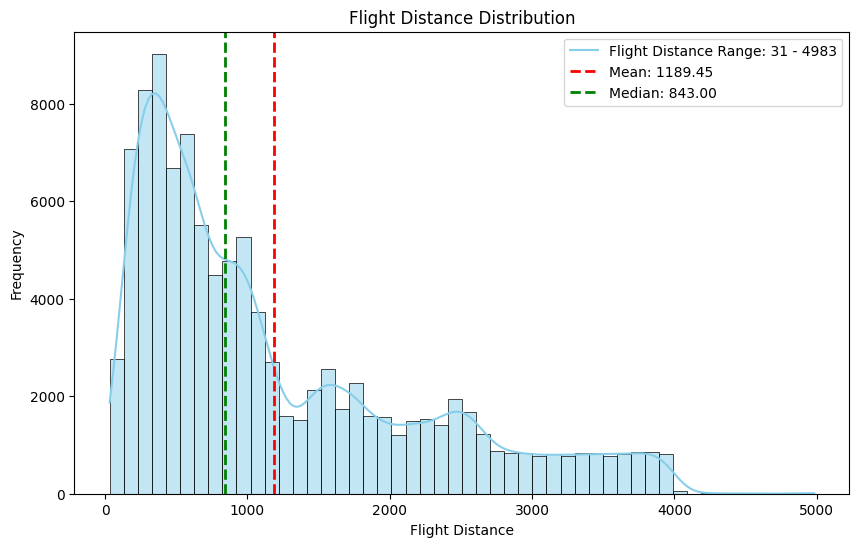

In [23]:
flight_distances = train_df['Flight Distance']

plt.figure(figsize=(10, 6))

# Plotting the histogram with seaborn
sns.histplot(flight_distances, bins=50, kde=True, color='skyblue', linewidth=0.5)

# Add vertical lines for mean and median
plt.axvline(flight_distances.mean(), color='r', linestyle='dashed', linewidth=2)
plt.axvline(flight_distances.median(), color='g', linestyle='dashed', linewidth=2)

# Setting labels and title
plt.xlabel('Flight Distance')
plt.ylabel('Frequency')
plt.title('Flight Distance Distribution')

# Create a custom legend entry
legend_entry = f'Flight Distance Range: {flight_distances.min()} - {flight_distances.max()}'
mean_line = f'Mean: {flight_distances.mean():.2f}'
median_line = f'Median: {flight_distances.median():.2f}'

# Display the result
plt.legend([legend_entry, mean_line, median_line])
plt.show()


Let's analyze the data visialize the flight distances and satisfaction density

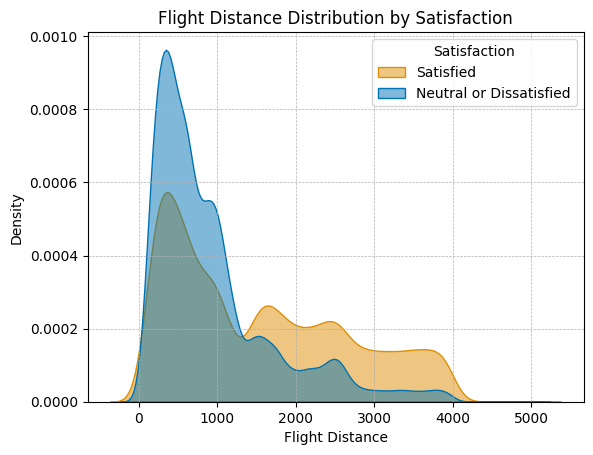

In [24]:
colors = sns.color_palette('colorblind', 2) # color blindness-friendly and limit the palette to 2 colors

# Plotting the density plots
sns.kdeplot(data=train_df, x='Flight Distance', hue='satisfaction', fill=True, common_norm=False, palette=colors, alpha=0.5)

# Setting labels and title
plt.xlabel('Flight Distance')
plt.ylabel('Density')
plt.title('Flight Distance Distribution by Satisfaction')

# Adding a legend
plt.legend(title='Satisfaction', labels=['Satisfied', 'Neutral or Dissatisfied'])

# Add gridlines
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Display the result
plt.show()


Let's analyze the data visialize the flight distances and gender density

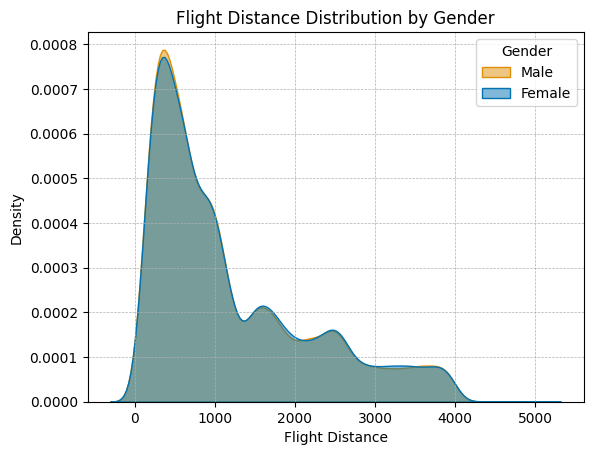

In [25]:
colors = sns.color_palette('colorblind', 2) # color blindness-friendly and limit the palette to 2 colors

# Plotting the density plots
sns.kdeplot(data=train_df, x='Flight Distance', hue='Gender', fill=True, common_norm=False, palette=colors, alpha=0.5)

# Setting labels and title
plt.xlabel('Flight Distance')
plt.ylabel('Density')
plt.title('Flight Distance Distribution by Gender')

# Adding a legend
plt.legend(title='Gender', labels=['Male', 'Female'])

# Add gridlines
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Display the result
plt.show()


Let's analyze the data visialize the satisfaction in relation to the departure delay in minutes

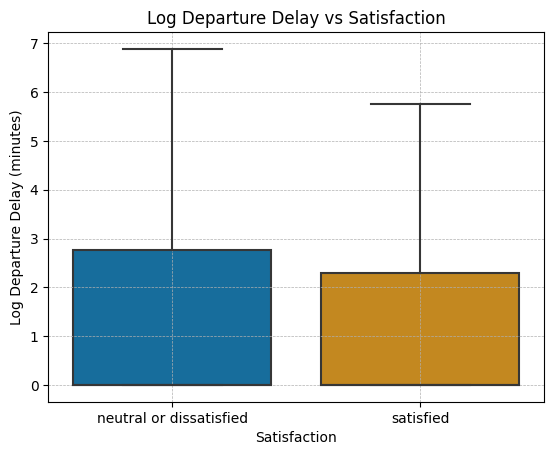

In [26]:
colors = sns.color_palette('colorblind')

# Order of the boxes
order = ['neutral or dissatisfied', 'satisfied']

# Plotting the box plot with log transformation, without outliers, and with a specific order
sns.boxplot(data=train_df, x='satisfaction', y=np.log1p(train_df['Departure Delay in Minutes']), 
            palette=colors, order=order, showfliers=False)

# Setting labels and title
plt.xlabel('Satisfaction')
plt.ylabel('Log Departure Delay (minutes)')
plt.title('Log Departure Delay vs Satisfaction')

# Adding gridlines
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Display the result
plt.show()


Let's analyze and display the correlation between departure delay and delay difference

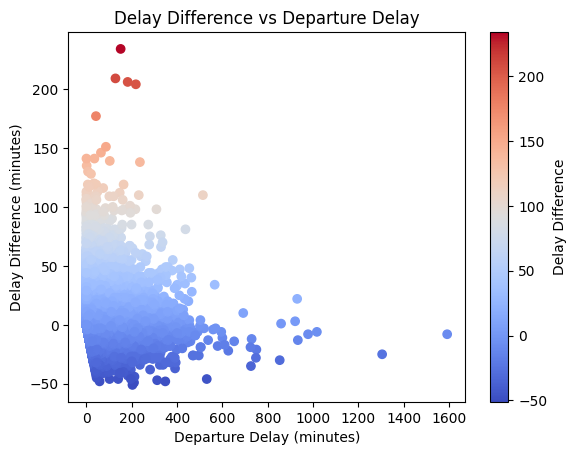

In [27]:
# Calculate the delay difference
train_df['Delay_Difference'] = train_df['Arrival Delay in Minutes'] - train_df['Departure Delay in Minutes']

# Plot the scatter graph with color variation
plt.scatter(train_df['Departure Delay in Minutes'], train_df['Delay_Difference'], c=train_df['Delay_Difference'], cmap='coolwarm')

# Set labels and title
plt.xlabel('Departure Delay (minutes)')
plt.ylabel('Delay Difference (minutes)')
plt.title('Delay Difference vs Departure Delay')

cbar = plt.colorbar()
cbar.set_label('Delay Difference')

# Display the result
plt.show()


Let's categorize flight based on the distances

In [28]:
# Define the category ranges
category_ranges = [0, 1000, 3000, float('inf')]
category_labels = ['Short', 'Moderate', 'Long']

# Categorize flight distances
train_df['Flight Distance Category'] = pd.cut(train_df['Flight Distance'], bins=category_ranges, labels=category_labels)
category_counts = train_df['Flight Distance Category'].value_counts()
long_flights = category_counts['Long']
moderate_flights = category_counts['Moderate']
short_flights = category_counts['Short']

Let's analyze the data visialize the flight distance categories and satisfaction density

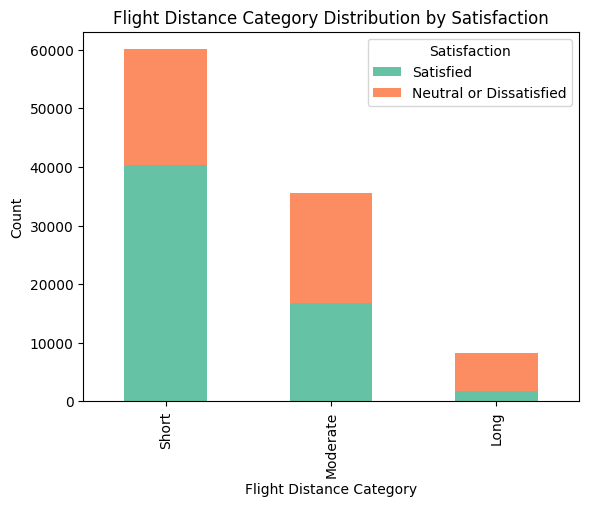

In [29]:
category_satisfaction_counts = train_df.groupby(['Flight Distance Category', 'satisfaction']).size().unstack()

# Define color palette
colors = ['#66c2a5', '#fc8d62', '#8da0cb']

# Plotting the bar chart
category_satisfaction_counts.plot(kind='bar', stacked=True, color=colors)

# Setting labels and title
plt.xlabel('Flight Distance Category')
plt.ylabel('Count')
plt.title('Flight Distance Category Distribution by Satisfaction')

# Display the result
plt.legend(title='Satisfaction', labels=['Satisfied', 'Neutral or Dissatisfied'])
plt.show()


Let's analyze the data visialize the flight distance categories by gender

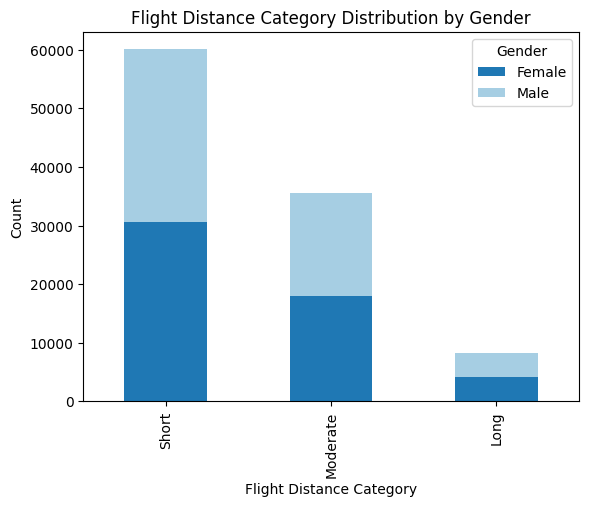

In [30]:
category_gender_counts = train_df.groupby(['Flight Distance Category', 'Gender']).size().unstack()

# Define color palette
colors = {'Male': '#a6cee3', 'Female': '#1f78b4'}

# Plotting the bar chart
category_gender_counts.plot(kind='bar', stacked=True, color=colors)

# Setting labels and title
plt.xlabel('Flight Distance Category')
plt.ylabel('Count')
plt.title('Flight Distance Category Distribution by Gender')

# Display the result
plt.legend(title='Gender')
plt.show()


Let's analyze the data visialize the age distribution by satisfaction

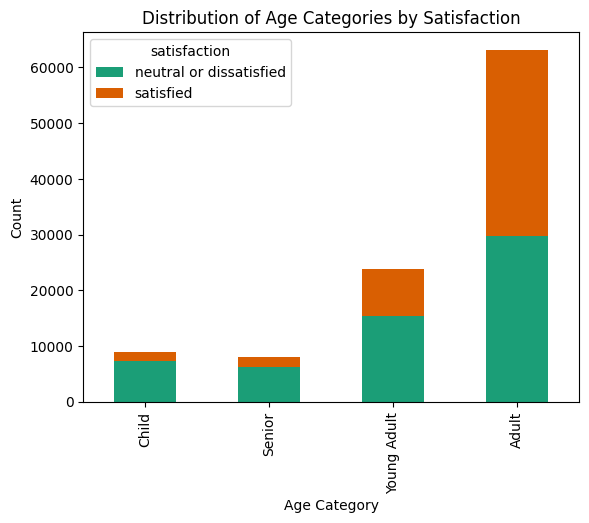

In [31]:
age_ranges = [0, 18, 30, 60, 120]
age_labels = ['Child', 'Young Adult', 'Adult', 'Senior']

# Categorize the age column
train_df['Age Category'] = pd.cut(train_df['Age'], bins=age_ranges, labels=age_labels)

# Define color palette
colors =['#1b9e77','#d95f02']

# Group the data by 'Age Category' and 'Satisfaction' and calculate the count
age_satisfaction_counts = train_df.groupby(['Age Category', 'satisfaction']).size().unstack()

# Sort the age categories based on the count of individuals in each category
age_satisfaction_counts = age_satisfaction_counts.sort_values(by='satisfied', ascending=True)

# Plot the bar chart
age_satisfaction_counts.plot(kind='bar', stacked=True, color=colors)

# Setting labels and title
plt.xlabel('Age Category')
plt.ylabel('Count')
plt.title('Distribution of Age Categories by Satisfaction')

# Display the result
plt.show()


Let's analyze the data visialize the age distribution by gender

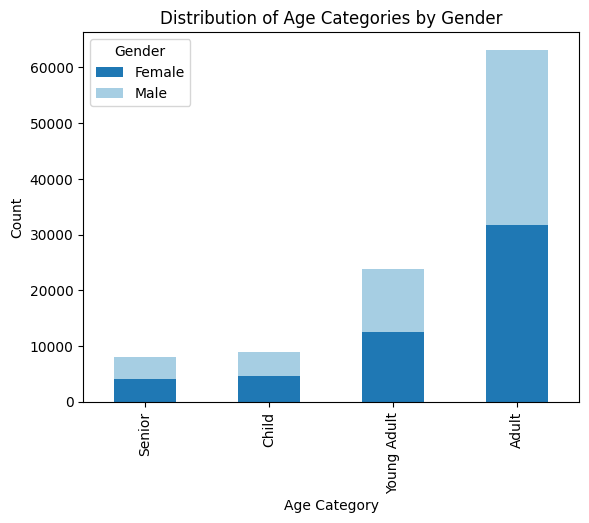

In [32]:
age_gender_counts = train_df.groupby(['Age Category', 'Gender']).size().unstack()

# Sort the age categories based on the count of individuals in each category for each gender
age_gender_counts = age_gender_counts.sort_values(by='Female', ascending=True)

# Define color palette
colors = {'Male': '#a6cee3', 'Female': '#1f78b4'}

# Plot the bar chart
age_gender_counts.plot(kind='bar', stacked=True, color=colors)

# Setting labels and title
plt.xlabel('Age Category')
plt.ylabel('Count')
plt.title('Distribution of Age Categories by Gender')

# Display the result
plt.show()


Let's analyze the data visialize the delay categories by satisfaction

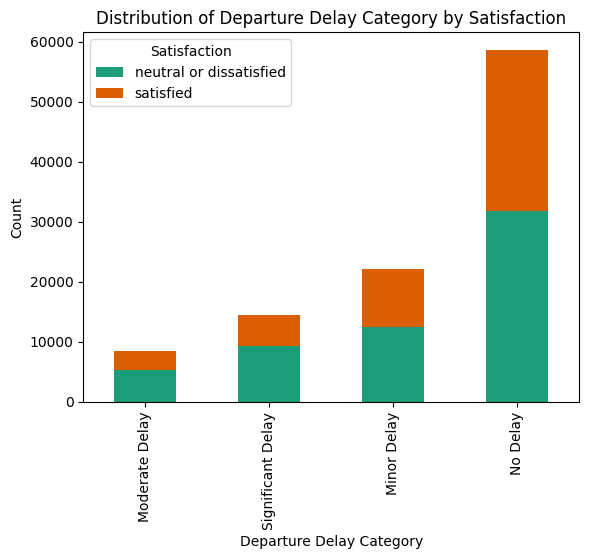

In [33]:
# Define the departure delay ranges and corresponding labels
delay_ranges = [-float('inf'), 0, 15, 30, float('inf')]
delay_labels = ['No Delay', 'Minor Delay', 'Moderate Delay', 'Significant Delay']

# Categorize the departure delay column
train_df['Departure Delay Category'] = pd.cut(train_df['Departure Delay in Minutes'], bins=delay_ranges, labels=delay_labels)

# Group the data by 'Departure Delay Category' and 'satisfaction' and calculate the count
departure_delay_satisfaction_counts = train_df.groupby(['Departure Delay Category', 'satisfaction']).size().unstack()

# Sort the values in ascending order
departure_delay_satisfaction_counts = departure_delay_satisfaction_counts.sort_values(by='satisfied')

# Define color palette
colors =['#1b9e77','#d95f02']


# Plot the bar chart
departure_delay_satisfaction_counts.plot(kind='bar', stacked=True,color=colors)

# Setting labels and title
plt.xlabel('Departure Delay Category')
plt.ylabel('Count')
plt.title('Distribution of Departure Delay Category by Satisfaction')

# Display the result
plt.legend(title='Satisfaction')
plt.show()


Let's analyze the data visialize the delay categories by gender

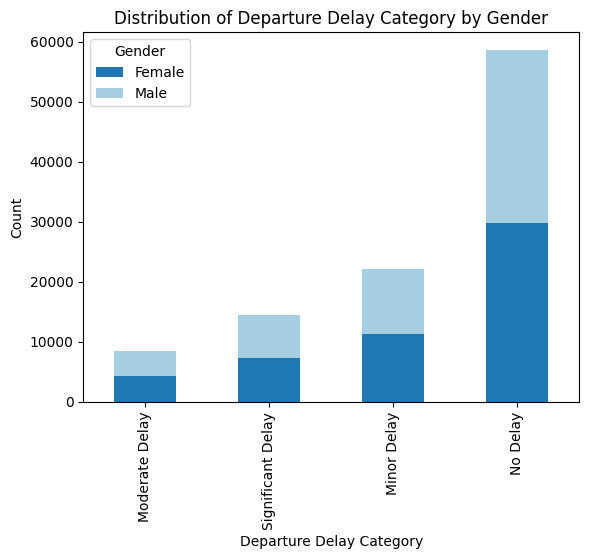

In [34]:
departure_delay_gender_counts = train_df.groupby(['Departure Delay Category', 'Gender']).size().unstack()

# Sort the departure delay categories based on the count of individuals in each category for each gender
departure_delay_gender_counts = departure_delay_gender_counts.sort_values(by=['Female', 'Male'], ascending=True)

# Define color palette
colors = {'Male': '#a6cee3', 'Female': '#1f78b4'}

# Plot the bar chart
departure_delay_gender_counts.plot(kind='bar', stacked=True,color=colors)

# Setting labels and title
plt.xlabel('Departure Delay Category')
plt.ylabel('Count')
plt.title('Distribution of Departure Delay Category by Gender')

# Display the result
plt.legend(title='Gender')
plt.show()


Let's transform the data and encode applicable columns

In [35]:
# Define the columns to encode
columns_to_encode = [
    'Flight Distance Category',
    'Age Category',
    'Departure Delay Category',
    'Class'
]

# Perform one-hot encoding on the specified columns
train_df = pd.get_dummies(train_df, columns=columns_to_encode)

# Get a list of the one-hot encoded columns
one_hot_columns = train_df.columns[train_df.columns.str.contains('|'.join(columns_to_encode))]

# Convert only the one-hot encoded columns to integers
train_df[one_hot_columns] = train_df[one_hot_columns].astype(int)

# Binary encoding
train_df['Gender'] = train_df['Gender'].map({'Male': 1, 'Female': 0})
train_df['Customer Type'] = train_df['Customer Type'].map({'Loyal Customer': 1, 'disloyal Customer': 0})
train_df['Type of Travel'] = train_df['Type of Travel'].map({'Personal Travel': 1, 'Business travel': 0})
train_df['satisfaction'] = train_df['satisfaction'].map({'satisfied': 1, 'neutral or dissatisfied': 0})

# Display the new datatypes
train_df.dtypes

Unnamed: 0                                      int64
id                                              int64
Gender                                          int64
Customer Type                                   int64
Age                                             int64
Type of Travel                                  int64
Flight Distance                                 int64
Inflight wifi service                           int64
Departure/Arrival time convenient               int64
Ease of Online booking                          int64
Gate location                                   int64
Food and drink                                  int64
Online boarding                                 int64
Seat comfort                                    int64
Inflight entertainment                          int64
On-board service                                int64
Leg room service                                int64
Baggage handling                                int64
Checkin service             

Let's drop irrelevant columns

In [36]:
# Define the columns to drop
columns_to_drop = ['Unnamed: 0', 'id', 'Arrival Delay in Minutes']

train_df = train_df.drop(columns_to_drop, axis=1)

Let's standardize and scale the applicable features - Age, Flight Distance, Departure Delay in Minutes, and Delay Difference

In [37]:
# Initialize the StandardScaler
standard_scaler = StandardScaler()

# Initialize the MinMaxScaler
min_max_scaler = MinMaxScaler()

# Define the applicable columns
columns_to_standardize = ['Age', 'Flight Distance', 'Departure Delay in Minutes', 'Delay_Difference']


# Fit the scaler on the applicable data and transform it
train_df[columns_to_standardize] = standard_scaler.fit_transform(train_df[columns_to_standardize])
train_df[columns_to_standardize] = min_max_scaler.fit_transform(train_df[columns_to_standardize])


## Model Training and Analysis

Let's define dataset that will be used in training and analysing the models

In [38]:
# Define the features and the target in the training dataset
X = train_df.drop('satisfaction', axis=1)
y = train_df['satisfaction']

# Split the data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=seed_value)

### Decision Tree Classifier
Let's train a Decision Tree Classifier model and record the results

In [39]:
# Initialize the Decision Tree Classifier with pre-defined seed
dt_model = DecisionTreeClassifier(random_state=seed_value)

# Fit the model to the training data
dt_model.fit(X_train, y_train)

# Predict the labels for the validation set
y_val_pred = dt_model.predict(X_val)

# Calculate the accuracy of the model
accuracy = accuracy_score(y_val, y_val_pred)

# Calculate the precision of the model
precision = precision_score(y_val, y_val_pred)

# Calculate the recall of the model
recall = recall_score(y_val, y_val_pred)

# Calculate the F1 score of the model
f1 = f1_score(y_val, y_val_pred)

# Generate the confusion matrix
conf_mat = confusion_matrix(y_val, y_val_pred)

print(f'Accuracy: {accuracy}')
print(f'Precision: {precision}')
print(f'Recall: {recall}')
print(f'F1 Score: {f1}')
print(f'Confusion Matrix: \n{conf_mat}')

Accuracy: 0.9429286367354796
Precision: 0.9325817860300619
Recall: 0.9360994009318837
F1 Score: 0.9343372826929466
Confusion Matrix: 
[[11157   610]
 [  576  8438]]


### Bagging Classifier
Let's train a Bagging Classifier model and record the results

In [40]:
# Initialize the base classifier
base_cls = DecisionTreeClassifier(random_state=seed_value)

# Initialize the Bagging Classifier with the same seed
bagging_model = BaggingClassifier(base_estimator=base_cls, n_estimators=100, random_state=seed_value)

# Fit the model to the training data
bagging_model.fit(X_train, y_train)

# Predict the labels for the validation set
y_val_pred = bagging_model.predict(X_val)

# Calculate the accuracy of the model
accuracy = accuracy_score(y_val, y_val_pred)

# Calculate the precision of the model
precision = precision_score(y_val, y_val_pred)

# Calculate the recall of the model
recall = recall_score(y_val, y_val_pred)

# Calculate the F1 score of the model
f1 = f1_score(y_val, y_val_pred)

# Generate the confusion matrix
conf_mat = confusion_matrix(y_val, y_val_pred)

print(f'Accuracy: {accuracy}')
print(f'Precision: {precision}')
print(f'Recall: {recall}')
print(f'F1 Score: {f1}')
print(f'Confusion Matrix: \n{conf_mat}')


/Users/adekunbi/miniconda3/lib/python3.10/site-packages/sklearn/ensemble/_base.py:166: FutureWarning:

`base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.



Accuracy: 0.9595303402146191
Precision: 0.9687966043363543
Recall: 0.9368759707122254
F1 Score: 0.9525689470419041
Confusion Matrix: 
[[11495   272]
 [  569  8445]]


### CatBoost Classifier
Let's train a CatBoost Classifier model and record the results

In [41]:
# Initialize the CatBoost model with the same seed
cat_model = CatBoostClassifier(verbose=0, random_seed=seed_value)

# Fit the model to the training data
cat_model.fit(X_train, y_train)

# Predict the labels for the validation set
y_val_pred = cat_model.predict(X_val)

# Calculate the accuracy of the model
accuracy = accuracy_score(y_val, y_val_pred)

# Calculate the precision of the model
precision = precision_score(y_val, y_val_pred)

# Calculate the recall of the model
recall = recall_score(y_val, y_val_pred)

# Calculate the F1 score of the model
f1 = f1_score(y_val, y_val_pred)

# Generate the confusion matrix
conf_mat = confusion_matrix(y_val, y_val_pred)

print(f'Accuracy: {accuracy}')
print(f'Precision: {precision}')
print(f'Recall: {recall}')
print(f'F1 Score: {f1}')
print(f'Confusion Matrix: \n{conf_mat}')


Accuracy: 0.9626581973918483
Precision: 0.9703128568166248
Recall: 0.9427557133348126
F1 Score: 0.9563358091379699
Confusion Matrix: 
[[11507   260]
 [  516  8498]]


### XGB Classifier
Let's train a XGB Classifier model and record the results

In [42]:
# Initialize the XGBoost model with the same seed
xgb_model = XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=seed_value)

# Fit the model to the training data
xgb_model.fit(X_train, y_train)

# Predict the labels for the validation set
y_val_pred = xgb_model.predict(X_val)

# Calculate the accuracy of the model
accuracy = accuracy_score(y_val, y_val_pred)

# Calculate the precision of the model
precision = precision_score(y_val, y_val_pred)

# Calculate the recall of the model
recall = recall_score(y_val, y_val_pred)

# Calculate the F1 score of the model
f1 = f1_score(y_val, y_val_pred)

# Generate the confusion matrix
conf_mat = confusion_matrix(y_val, y_val_pred)

print(f'Accuracy: {accuracy}')
print(f'Precision: {precision}')
print(f'Recall: {recall}')
print(f'F1 Score: {f1}')
print(f'Confusion Matrix: \n{conf_mat}')

/Users/adekunbi/miniconda3/lib/python3.10/site-packages/xgboost/sklearn.py:1395: UserWarning:

`use_label_encoder` is deprecated in 1.7.0.



Accuracy: 0.9608296039651605
Precision: 0.969214923323415
Recall: 0.939538495673397
F1 Score: 0.9541460117169898
Confusion Matrix: 
[[11498   269]
 [  545  8469]]


### AdaBoost Classifier
Let's train a AdaBoost Classifier model and record the results

In [43]:
# Initialize the AdaBoost Classifier with the same seed
abc = AdaBoostClassifier(random_state=seed_value)

# Fit the model to the training data
abc.fit(X_train, y_train)

# Predict the labels for the validation set
y_val_pred = abc.predict(X_val)

# Calculate the accuracy of the model
accuracy = accuracy_score(y_val, y_val_pred)

# Calculate the precision of the model
precision = precision_score(y_val, y_val_pred)

# Calculate the recall of the model
recall = recall_score(y_val, y_val_pred)

# Calculate the F1 score of the model
f1 = f1_score(y_val, y_val_pred)

# Generate the confusion matrix
conf_mat = confusion_matrix(y_val, y_val_pred)

print(f'Accuracy: {accuracy}')
print(f'Precision: {precision}')
print(f'Recall: {recall}')
print(f'F1 Score: {f1}')
print(f'Confusion Matrix: \n{conf_mat}')


Accuracy: 0.9257013618208941
Precision: 0.9195686362615143
Recall: 0.9081428888395828
F1 Score: 0.9138200491181068
Confusion Matrix: 
[[11051   716]
 [  828  8186]]


### Gradient Boosting Classifier
Let's train a Gradient Boosting Classifier model and record the results

In [44]:
# Initialize the Gradient Boosting model with the same seed
gb_model = GradientBoostingClassifier(random_state=seed_value)

# Fit the model to the training data
gb_model.fit(X_train, y_train)

# Predict the labels for the validation set
y_val_pred = gb_model.predict(X_val)

# Calculate the accuracy of the model
accuracy = accuracy_score(y_val, y_val_pred)

# Calculate the precision of the model
precision = precision_score(y_val, y_val_pred)

# Calculate the recall of the model
recall = recall_score(y_val, y_val_pred)

# Calculate the F1 score of the model
f1 = f1_score(y_val, y_val_pred)

print(f'Accuracy: {accuracy}')
print(f'Precision: {precision}')
print(f'Recall: {recall}')
print(f'F1 Score: {f1}')
print(f'Confusion Matrix: \n{conf_mat}')

Accuracy: 0.9416293729849382
Precision: 0.9454150964942332
Recall: 0.9184601730641225
F1 Score: 0.9317427269146361
Confusion Matrix: 
[[11051   716]
 [  828  8186]]


### Random Forest Classifier
Let's train a Random Forest Classifier model and record the results

In [45]:
# Initialize the Random Forest model with the same seed
rf_model = RandomForestClassifier(n_estimators=100, random_state=seed_value)

# Fit the model to the training data
rf_model.fit(X_train, y_train)

# Predict the labels for the validation set
y_val_pred = rf_model.predict(X_val)

# Calculate the accuracy of the model
accuracy = accuracy_score(y_val, y_val_pred)

# Calculate the precision of the model
precision = precision_score(y_val, y_val_pred)

# Calculate the recall of the model
recall = recall_score(y_val, y_val_pred)

# Calculate the F1 score of the model
f1 = f1_score(y_val, y_val_pred)

# Generate the confusion matrix
conf_mat = confusion_matrix(y_val, y_val_pred)

print(f'Accuracy: {accuracy}')
print(f'Precision: {precision}')
print(f'Recall: {recall}')
print(f'F1 Score: {f1}')
print(f'Confusion Matrix: \n{conf_mat}')

Accuracy: 0.9586641643809248
Precision: 0.9678714859437751
Recall: 0.9357665853117373
F1 Score: 0.9515483106774212
Confusion Matrix: 
[[11487   280]
 [  579  8435]]


### K-Nearest Neighbor Classifier
Let's train a K-Nearest Neighbor Classifier model and record the results

In [46]:
# Initialize the KNN classifier model with n_neighbors=5 (default)
knn = KNeighborsClassifier()

# Fit the model to the training data
knn.fit(X_train, y_train)

# Predict the labels for the validation set
y_val_pred = knn.predict(X_val)

# Calculate the accuracy of the model
accuracy = accuracy_score(y_val, y_val_pred)

# Calculate the precision of the model
precision = precision_score(y_val, y_val_pred)

# Calculate the recall of the model
recall = recall_score(y_val, y_val_pred)

# Calculate the F1 score of the model
f1 = f1_score(y_val, y_val_pred)

# Generate the confusion matrix
conf_mat = confusion_matrix(y_val, y_val_pred)

print(f'Accuracy: {accuracy}')
print(f'Precision: {precision}')
print(f'Recall: {recall}')
print(f'F1 Score: {f1}')
print(f'Confusion Matrix: \n{conf_mat}')

Accuracy: 0.9273374717289832
Precision: 0.9338575393154487
Recall: 0.8959396494342134
F1 Score: 0.9145057184916769
Confusion Matrix: 
[[11195   572]
 [  938  8076]]


## Model Performance Evaluation

 ### Test Data Preprocessing
 
 The columns and data format of the test data needs to be the same with the data used to train the models. Hence the same preprocessing and normalization steps will be carried out on the test data

In [47]:
# Load the test data file
test_df = pd.read_csv('test.csv')

print(f'Number of rows: {test_df.shape[0]}')
print(f'Number of columns: {test_df.shape[1]}')

# Predict missing Arrival delay in minutes based on the Departure delay in minutes using our Linear Regression model
test_subset = test_df[['Arrival Delay in Minutes', 'Departure Delay in Minutes']]
X_test = test_subset[test_subset['Arrival Delay in Minutes'].isnull()]['Departure Delay in Minutes']
y_test_pred = lr_model.predict(X_test.values.reshape(-1, 1))

# Fill in the missing values in the original test DataFrame
test_df.loc[test_subset['Arrival Delay in Minutes'].isnull(), 'Arrival Delay in Minutes'] = y_test_pred

# Calculate the delay difference for the test data
test_df['Delay_Difference'] = test_df['Arrival Delay in Minutes'] - test_df['Departure Delay in Minutes']

# Categorize flight distances in test data
test_df['Flight Distance Category'] = pd.cut(test_df['Flight Distance'], bins=category_ranges, labels=category_labels)

# Categorize age range in test data
test_df['Age Category'] = pd.cut(test_df['Age'], bins=age_ranges, labels=age_labels)

# Categorize departure delay
test_df['Departure Delay Category'] = pd.cut(test_df['Departure Delay in Minutes'], bins=delay_ranges, labels=delay_labels)

# Perform one-hot encoding on the applicable columns
test_df = pd.get_dummies(test_df, columns=columns_to_encode)

# Get a list of the one-hot encoded columns
one_hot_columns = test_df.columns[test_df.columns.str.contains('|'.join(columns_to_encode))]

# Convert only the one-hot encoded columns to integers
test_df[one_hot_columns] = test_df[one_hot_columns].astype(int)

# Binary encoding
test_df['Gender'] = test_df['Gender'].map({'Male': 1, 'Female': 0})
test_df['Customer Type'] = test_df['Customer Type'].map({'Loyal Customer': 1, 'disloyal Customer': 0})
test_df['Type of Travel'] = test_df['Type of Travel'].map({'Personal Travel': 1, 'Business travel': 0})
test_df['satisfaction'] = test_df['satisfaction'].map({'satisfied': 1, 'neutral or dissatisfied': 0})

# Drop the identified irrelevant columns from the test data
test_df = test_df.drop(columns_to_drop, axis=1)

# Standardize the columns
test_df[columns_to_standardize] = standard_scaler.transform(test_df[columns_to_standardize])
test_df[columns_to_standardize] = min_max_scaler.fit_transform(test_df[columns_to_standardize])


Number of rows: 25976
Number of columns: 25


Let's display the test datatypes

In [48]:
test_df.dtypes

Gender                                          int64
Customer Type                                   int64
Age                                           float64
Type of Travel                                  int64
Flight Distance                               float64
Inflight wifi service                           int64
Departure/Arrival time convenient               int64
Ease of Online booking                          int64
Gate location                                   int64
Food and drink                                  int64
Online boarding                                 int64
Seat comfort                                    int64
Inflight entertainment                          int64
On-board service                                int64
Leg room service                                int64
Baggage handling                                int64
Checkin service                                 int64
Inflight service                                int64
Cleanliness                 

Let's display a few rows from the processed test data

In [49]:
test_df.head()

,Gender,Customer Type,Age,Type of Travel,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,...,Age Category_Young Adult,Age Category_Adult,Age Category_Senior,Departure Delay Category_No Delay,Departure Delay Category_Minor Delay,Departure Delay Category_Moderate Delay,Departure Delay Category_Significant Delay,Class_Business,Class_Eco,Class_Eco Plus
0,0,1,0.576923,0,0.026050,5,4,3,4,3,...,0,1,0,0,0,0,1,0,1,0
1,0,1,0.371795,0,0.571890,1,1,3,1,5,...,0,1,0,1,0,0,0,1,0,0
2,1,0,0.166667,0,0.032512,2,0,2,4,2,...,1,0,0,1,0,0,0,0,1,0
3,1,1,0.474359,0,0.675687,0,0,0,2,3,...,0,1,0,1,0,0,0,1,0,0
4,0,1,0.538462,0,0.232431,2,3,4,3,4,...,0,1,0,1,0,0,0,0,1,0


Let's test our models and record the results

In [50]:
# Separate features and target
X_test = test_df.drop('satisfaction', axis=1)
y_test = test_df['satisfaction']

# List of models
models = [dt_model,bagging_model,cat_model,xgb_model, abc,gb_model,rf_model,knn]

# Corresponding model names
model_names = ['DecisionTreeClassifier','BaggingClassifier','CatBoostClassifier','XGBClassifier','AdaBoost',
               'Gradient Boosting','Random Forest', 'K-Nearest Neighbors']

# Lists to store metrics for all models
accuracies = []
precisions = []
recalls = []
f1_scores = []

# Iterate over each model and evaluate it
for model, name in zip(models, model_names):
    # Generate predictions using the test data
    y_test_pred = model.predict(X_test)

    # Calculate results and append each to the applicable metric list
    accuracy = accuracy_score(y_test, y_test_pred)
    accuracies.append(accuracy)

    precision = precision_score(y_test, y_test_pred)
    precisions.append(precision)

    recall = recall_score(y_test, y_test_pred)
    recalls.append(recall)

    f1 = f1_score(y_test, y_test_pred)
    f1_scores.append(f1)

    # Print results
    print(f'{name}:')
    print(f'Accuracy: {accuracy}')
    print(f'Precision: {precision}')
    print(f'Recall: {recall}')
    print(f'F1 Score: {f1}\n')


DecisionTreeClassifier:
Accuracy: 0.9412919618109024
Precision: 0.9383209087681931
Recall: 0.9272121371568885
F1 Score: 0.9327334480172907

BaggingClassifier:
Accuracy: 0.9595395749923006
Precision: 0.9755604557148108
Recall: 0.9311584670700693
F1 Score: 0.952842464216808

CatBoostClassifier:
Accuracy: 0.9626578380043117
Precision: 0.9821610130326278
Recall: 0.9318600368324125
F1 Score: 0.956349563495635

XGBClassifier:
Accuracy: 0.960655990144749
Precision: 0.9811810512654121
Recall: 0.9281767955801105
F1 Score: 0.9539432176656152

AdaBoost:
Accuracy: 0.9222744071450569
Precision: 0.9389970059880239
Recall: 0.8801192668595984
F1 Score: 0.9086053143814222

Gradient Boosting:
Accuracy: 0.9405990144748999
Precision: 0.9539594843462247
Recall: 0.9085328422344997
F1 Score: 0.9306921798499754

Random Forest:
Accuracy: 0.959154604250077
Precision: 0.9747521116415718
Recall: 0.9310707708497764
F1 Score: 0.9524108544516708

K-Nearest Neighbors:
Accuracy: 0.9287419156144133
Precision: 0.9397790

Let's display bar chart showing the comparative performance metrics of the models

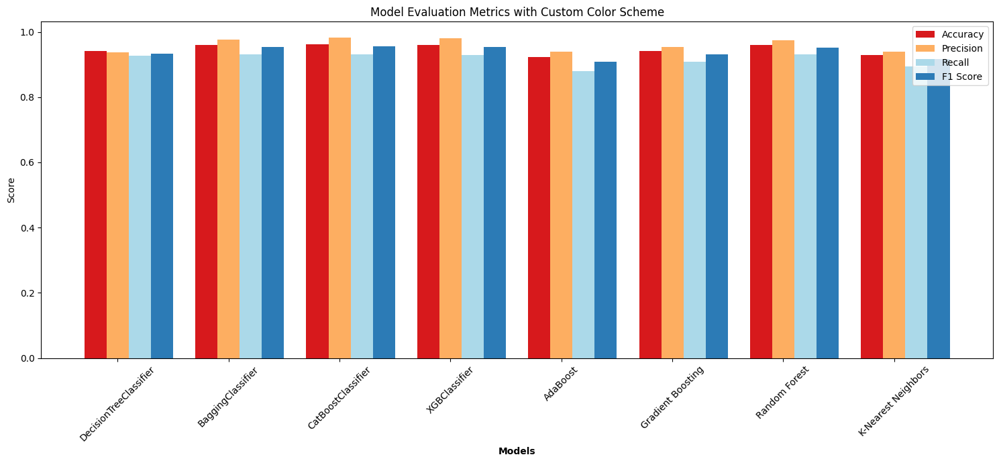

In [51]:
# Define color palette
colors = ['#d7191c','#fdae61','#abd9e9','#2c7bb6']

# Set up the bar positions
barWidth = 0.2
r1 = np.arange(len(models))
r2 = [x + barWidth for x in r1]
r3 = [x + barWidth for x in r2]
r4 = [x + barWidth for x in r3]


# Plotting with the provided color scheme
plt.figure(figsize=(15, 7))
plt.bar(r1, accuracies, width=barWidth, color=colors[0], label='Accuracy')
plt.bar(r2, precisions, width=barWidth, color=colors[1], label='Precision')
plt.bar(r3, recalls, width=barWidth, color=colors[2], label='Recall')
plt.bar(r4, f1_scores, width=barWidth, color=colors[3], label='F1 Score')

# Display result
plt.xlabel('Models', fontweight='bold')
plt.xticks([r + barWidth for r in range(len(accuracies))], model_names, rotation=45)
plt.ylabel('Score')
plt.title('Model Evaluation Metrics with Custom Color Scheme')
plt.legend()
plt.tight_layout()
plt.show()

## Feature Selection
Having examined the results of the analyzed models, the best model to use for predicting features airline needs to focus on is CatBoost. Using this model, let's order our features based on their importance and display the result using a barchart

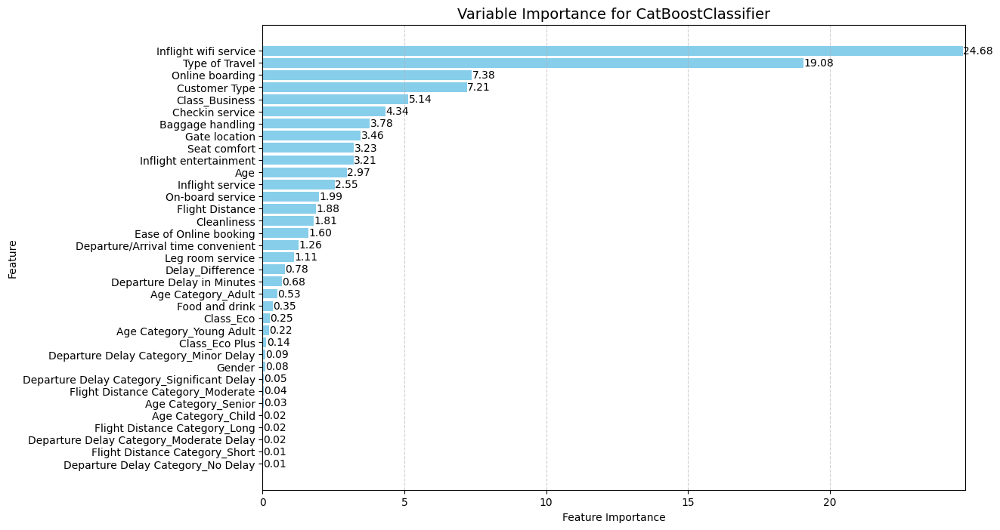

In [52]:

# Get feature importances from the cat_model
feature_importances = cat_model.feature_importances_

# Get the names of the features
feature_names = X.columns

# Sort features based on importance
sorted_idx = np.argsort(feature_importances)
feature_names = feature_names[sorted_idx]
feature_importances = feature_importances[sorted_idx]

# Create a bar chart to visualize variable importance
plt.figure(figsize=(12, 8))
bars = plt.barh(feature_names, feature_importances, color='skyblue')

# Display the importance score to the right of each feature bar
for bar in bars:
    plt.text(bar.get_width() + 0.01, bar.get_y() + bar.get_height()/2, 
             f'{bar.get_width():.2f}', 
             va='center', ha='left', color='black', fontsize=10)

plt.xlabel('Feature Importance', fontsize=10)
plt.ylabel('Feature', fontsize=10)
plt.title('Variable Importance for CatBoostClassifier', fontsize=14)
plt.grid(axis='x', linestyle='--', alpha=0.6)
plt.xlim(0, max(feature_importances) + 0.1)
plt.show()
